In [38]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from os import listdir
from os.path import isfile, join
%matplotlib inline

In [39]:
def calibrate_image(img, objpoints, imgpoints, objp):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    # If found, draw corners
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)
        
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        
    return cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

def undistort_image(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)


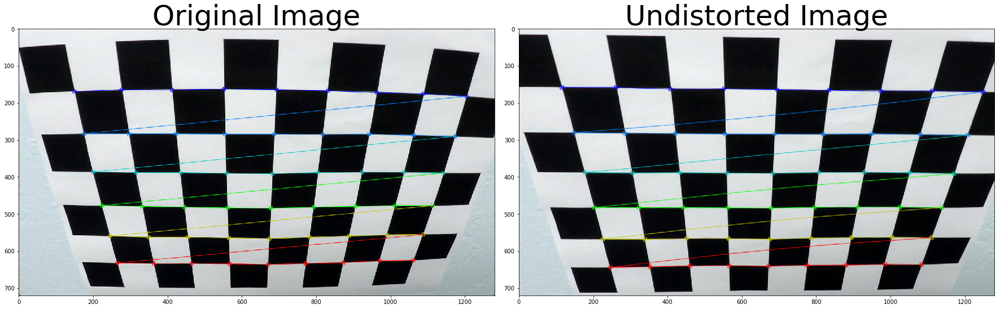

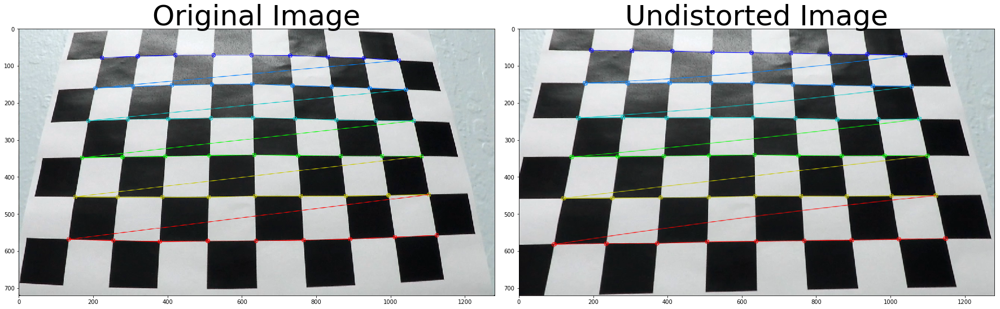

In [45]:
nx = 9#TODO: enter the number of inside corners in x
ny = 6#TODO: enter the number of inside corners in y
objpoints = []
imgpoints = []
objp = np.zeros((9*6,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Make a list of calibration images
images = ['camera_cal/calibration2.jpg', 'camera_cal/calibration3.jpg']

for fname in images:
    img = cv2.imread(fname)
    ret, mtx, dist, rvecs, tvecs = calibrate_image(img, objpoints, imgpoints, objp)
    undistorted = undistort_image(img, mtx, dist)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    

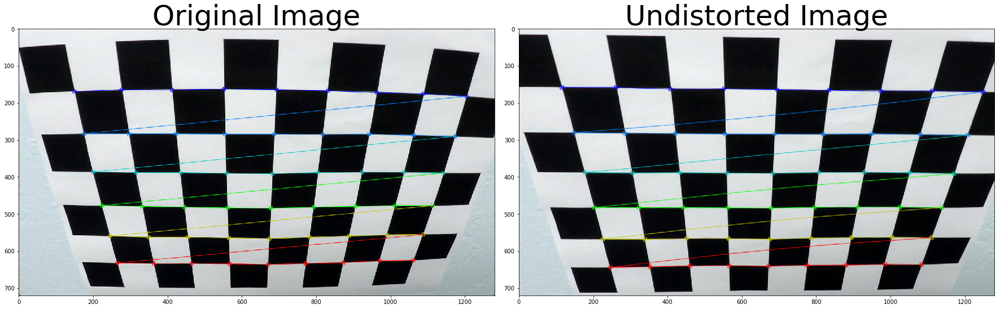

In [51]:
#Finding in mtx, dst
img = cv2.imread('camera_cal/calibration2.jpg')
ret, mtx, dist, rvecs, tvecs = calibrate_image(img, objpoints, imgpoints, objp)
undistorted = undistort_image(img, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

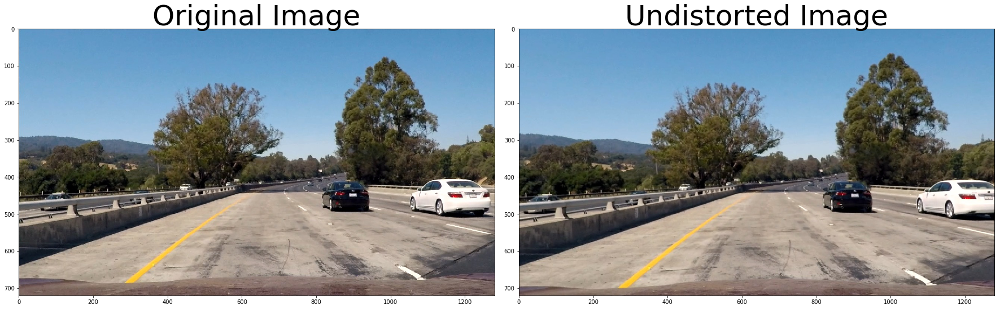

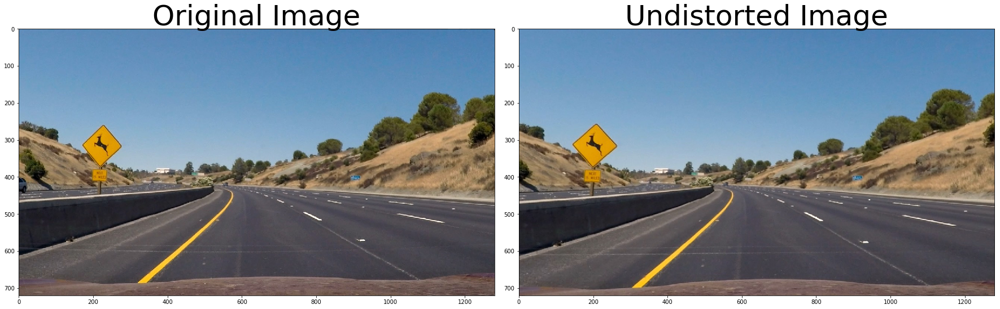

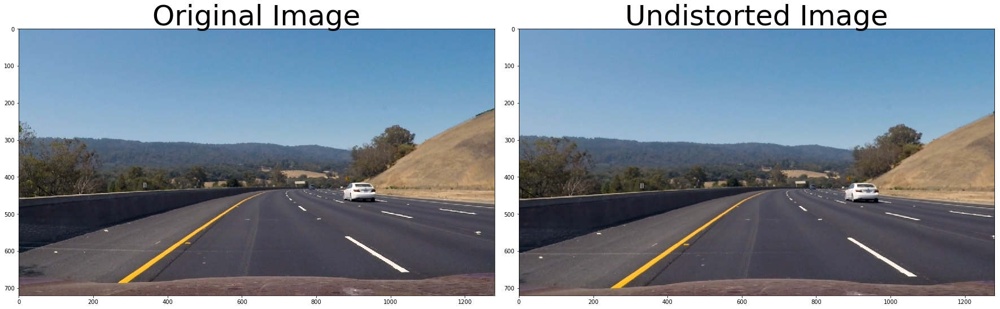

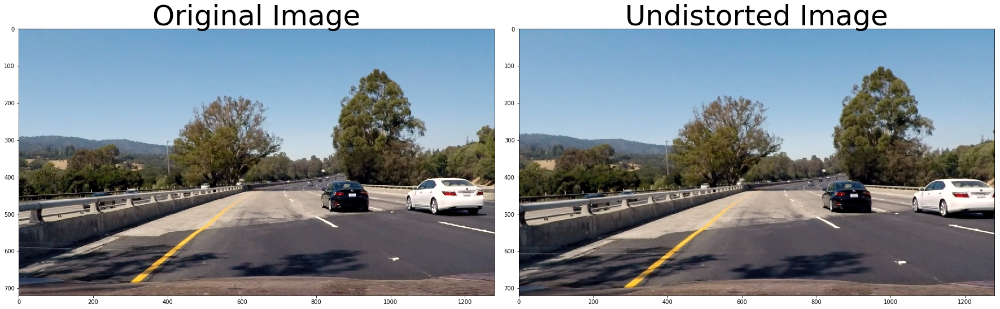

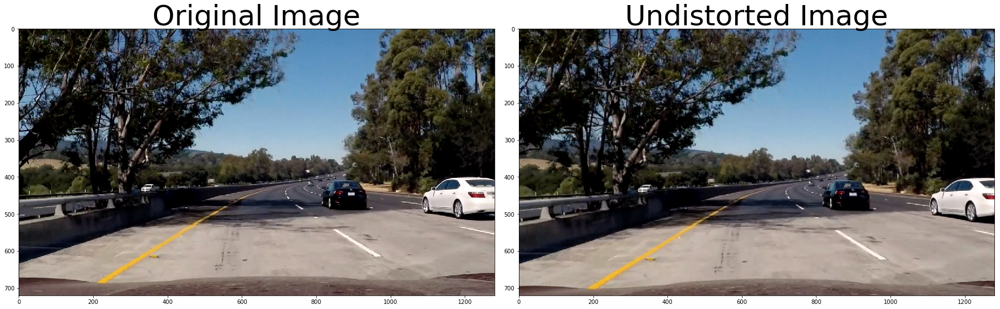

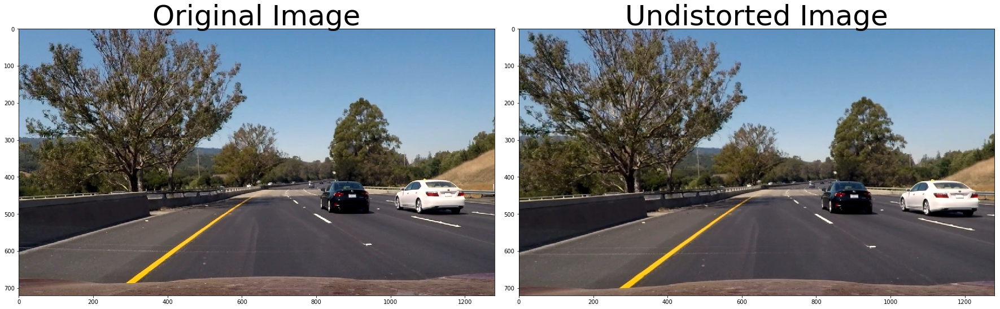

In [53]:
#Apply in test images

images = ['test_images/test1.jpg', 'test_images/test2.jpg','test_images/test3.jpg', 'test_images/test4.jpg','test_images/test5.jpg', 'test_images/test6.jpg']

for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    undistorted = undistort_image(img, mtx, dist)    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
